In [1]:
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
import time
from tqdm import tqdm

import copy

import torch
import torch.nn as nn
import torch.nn.parameter as param
import torch.nn.functional as F
import torch.optim as optim

from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler
from sklearn.utils import shuffle

import numpy as np
import pandas as pd
import os

# import calc
# import model

In [2]:
device = torch.device('cuda:1' if torch.cuda.is_available() else 'cpu')
try: print(torch.cuda.get_device_name(0))
except: print(device)

NVIDIA GeForce RTX 2070 SUPER


In [3]:
batch_size = 1024
test_portion = 0.1
val_portion = 0.2
seed = 64
num_epochs=100
dropout_rate = 0.1

# calc

In [4]:
def KL(mu1, sig1, mu2, sig2):
    D_KL = torch.log(sig2/(sig1 + 1e-5)+1e-5) + (sig1**2+(mu1-mu2)**2)/(2*sig2**2 + 1e-5) - 0.5
    return torch.mean(D_KL, dim=1)

# data loading - CIFAR10

In [5]:
from torchvision.datasets import CIFAR10

cifar10_train = CIFAR10(root='.', download=True, train=True)

x_all = cifar10_train.data
y_all = cifar10_train.targets

x_id = []
y_id = []

for i in range(len(x_all)):
    x = x_all[i]
    y = y_all[i]

    x_id.append(x)
    y_id.append(y)
x_id, y_id = shuffle(x_id, y_id)

# train test split only for classification objective
test_size = int(len(x_id)*test_portion)
val_size = int(len(x_id)*val_portion)
train_size = len(x_id) - test_size - val_size

train_x_id, train_y_id = x_id[0:train_size], y_id[0:train_size]
val_x_id, val_y_id = x_id[train_size:train_size+val_size], y_id[train_size:train_size+val_size]
test_x_id, test_y_id = x_id[-test_size:], y_id[-test_size:]

Files already downloaded and verified


In [6]:
# t = torch.stack(train_x_id, dim=0)
# train_mean = t.mean()
# train_std = t.std()

def preprocess(x):
    # x = (x-train_mean)/train_std
    x /= 255.
    return x.permute(0, 3, 1, 2)

In [7]:
train_data = torch.FloatTensor(np.stack(train_x_id))#.permute(0, 3, 1, 2)
train_unlab = torch.FloatTensor(np.stack(shuffle(train_x_id)))#.permute(0, 3, 1, 2)
shift = 0

# train dl
train_dataset = TensorDataset(preprocess(train_unlab), preprocess(train_data), torch.tensor(train_y_id))
train_sampler = RandomSampler(train_dataset, replacement=False)
train_dl = DataLoader(train_dataset, batch_size=batch_size, shuffle=False, sampler=train_sampler)

# calibration dl
cal_dataset = TensorDataset(preprocess(train_unlab[:test_size]), preprocess(train_data[:test_size]), torch.tensor(train_y_id[:test_size]))
cal_sampler = SequentialSampler(cal_dataset)
cal_dl = DataLoader(cal_dataset, batch_size=1, shuffle=False, sampler=cal_sampler)

# val_dl
val_data = torch.FloatTensor(np.stack(val_x_id))#.permute(0, 3, 1, 2)
val_unlab = torch.FloatTensor(np.stack(shuffle(val_x_id)))#.permute(0, 3, 1, 2)
val_dataset = TensorDataset(preprocess(val_unlab), preprocess(val_data), torch.tensor(val_y_id))
val_sampler = SequentialSampler(val_dataset)
val_dl = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, sampler=val_sampler)

# test dl
test_data = torch.FloatTensor(np.stack(test_x_id))#.permute(0, 3, 1, 2)
test_unlab = torch.FloatTensor(np.stack(shuffle(test_x_id)))#.permute(0, 3, 1, 2)
test_dataset = TensorDataset(preprocess(test_unlab), preprocess(test_data), torch.tensor(test_y_id))
test_sampler = SequentialSampler(test_dataset)
test_dl = DataLoader(test_dataset, batch_size=1, shuffle=False, sampler=test_sampler)

In [8]:
for step, (xu, xs, ys) in enumerate(train_dl):
    break

In [9]:
xs.shape

torch.Size([1024, 3, 32, 32])

# Model

In [10]:
import AAE
import importlib
importlib.reload(AAE)

# (input_shape, hidden_enc, enc_layers, latent_y, latent_z, 
#                hidden_dec, dec_layers, disc_y, disc_y_layers, disc_z, disc_z_layers,
#                dropout_rate=0.1)
model = AAE.make_model(512, 1000, 2, 10, 8, 1000, 2, 128, 2, 128, 2, dropout_rate=dropout_rate)

# Training

In [11]:
from AAE_train import make_step, find_acc, evaluate, train

In [12]:
num_epochs = 100
learning_rate = 1e-2
momentum=0.9

In [13]:
optims_scheds = {}
optim_reconst = optim.SGD(list(model.enc.parameters()) + list(model.dec.parameters()), lr=learning_rate*10, momentum=momentum)
lr_re = torch.optim.lr_scheduler.CosineAnnealingLR(optim_reconst, T_max=len(train_dl)*num_epochs)
# lr_re = None
optims_scheds['reconst'] = (optim_reconst, lr_re)

optim_discz = optim.SGD(model.d_z.parameters(), lr=learning_rate, momentum=momentum)
lr_dz = torch.optim.lr_scheduler.CosineAnnealingLR(optim_discz, T_max=len(train_dl)*num_epochs)
# lr_dz = None
optims_scheds['disc_z'] = (optim_discz, lr_dz)

optim_discy = optim.SGD(model.d_y.parameters(), lr=learning_rate, momentum=momentum)
lr_dy = torch.optim.lr_scheduler.CosineAnnealingLR(optim_discy, T_max=len(train_dl)*num_epochs)
# lr_dy = None
optims_scheds['disc_y'] = (optim_discy, lr_dy)

enc_params = list(model.enc.input_block.parameters())
enc_params += list(model.enc.blocks.parameters())
enc_params += list(model.enc.z_block.parameters())
optim_enc = optim.SGD(enc_params, lr=learning_rate, momentum=momentum)
lr_en = torch.optim.lr_scheduler.CosineAnnealingLR(optim_enc, T_max=len(train_dl)*num_epochs)
# lr_en = None
optims_scheds['enc'] = (optim_enc, lr_en)

y_params = list(model.enc.y_block.parameters()) \
            + list(model.enc.input_block.parameters()) \
            + list(model.enc.blocks.parameters())
optim_y = optim.SGD(y_params, lr=learning_rate, momentum=momentum)
lr_y = torch.optim.lr_scheduler.CosineAnnealingLR(optim_y, T_max=len(train_dl)*num_epochs)
# lr_y = None
optims_scheds['y_'] = (optim_y, lr_y)

In [14]:
# train(model, train_dl, num_epochs, device, optim_sched, verbose_freq=50, save=True, cache_dir=None, val_dl=None):
torch.autograd.set_detect_anomaly(False)
epoch_history, batch_history = train(model, train_dl, num_epochs, device, optims_scheds,
                                     verbose_freq=100,
                                     cache_dir = '.\\cache',
                                     val_dl=val_dl,
                                     pretraining=False,
                                     model_name='CIFAR10'
                                     )

c    | : [0.77066552 0.66966105]
|    y_d_acc    | : [0.99988839 1.        ]
|     y_acc     | : 0.892986
Epoch 67 Val:
|    reconst    | : 6.027328
|    disc_y     | : 0.000334
|    disc_z     | : 1.153341
|      enc      | : 9.737702
|      y_       | : 2.286855
|    z_d_acc    | : [0.78509247 0.59984056]
|    y_d_acc    | : [1. 1.]
|     y_acc     | : 0.899603
Epoch 67 - time taken: 13.976001262664795
Epoch 68 Train:
|    reconst    | : 4.751179
|    disc_y     | : 0.000860
|    disc_z     | : 1.130950
|      enc      | : 14.523898
|      y_       | : 2.290077
|    z_d_acc    | : [0.75831109 0.67047021]
|    y_d_acc    | : [0.99974888 1.        ]
|     y_acc     | : 0.892715
Epoch 68 Val:
|    reconst    | : 5.977004
|    disc_y     | : 0.000648
|    disc_z     | : 1.179569
|      enc      | : 9.713344
|      y_       | : 2.286790
|    z_d_acc    | : [0.76696229 0.59694874]
|    y_d_acc    | : [0.99980469 1.        ]
|     y_acc     | : 0.899721
Epoch 68 - time taken: 11.68999242782

# Result

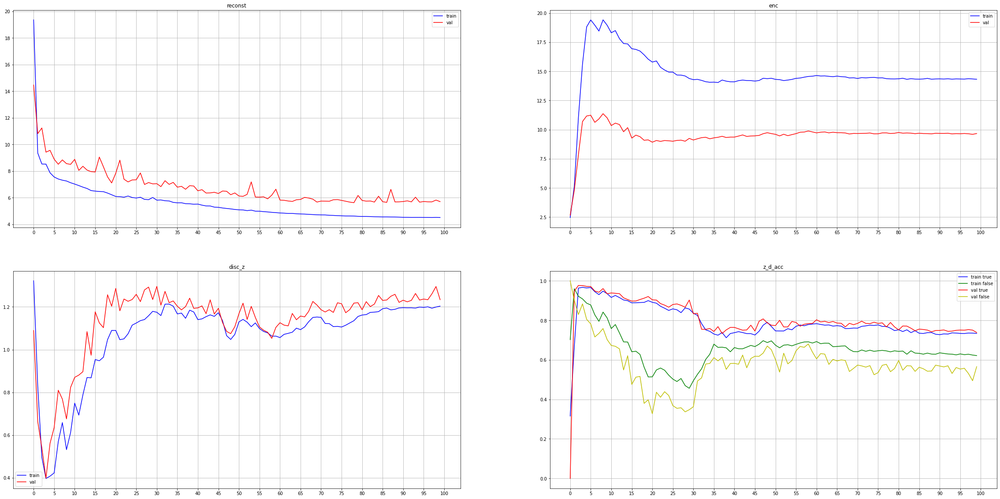

In [16]:
keys = ['reconst', 'disc_z', 'enc', 'z_d_acc']
def show_results(epoch_hist, batch_hist):
    fig, axs = plt.subplots(2, 2, figsize=(40, 20))
    train_plots = epoch_hist['train']
    val_plots = epoch_hist['val']

    for k in range(len(keys)):
        key = keys[k]
        train_ys = train_plots[key]
        val_ys = val_plots[key]
        xs = [i for i in range(len(train_ys))]
        ax = axs[k%2, k//2]

        if type(train_ys[0]) != np.ndarray:
            ax.plot(xs, train_ys, 'b-', label='train')
            ax.plot(xs, val_ys, 'r-', label='val')
            ax.title.set_text(key)
        else:
            l1 = ax.plot(xs, [i[0] for i in train_ys], 'b-', label='train true')
            l2 = ax.plot(xs, [i[1] for i in train_ys], 'g-', label='train false')
            l3 = ax.plot(xs, [i[0] for i in val_ys], 'r-', label='val true')
            l4 = ax.plot(xs, [i[1] for i in val_ys], 'y-', label='val false')
            ax.title.set_text(key)
        ax.legend()
        ax.xaxis.set_ticks(np.arange(0, num_epochs+1, 5))
        ax.grid()

    plt.show()

show_results(epoch_history, batch_history)

In [17]:
with open('.\\cache\\savestates\\CIFAR10_5.pkl', 'rb') as f:
    save_state = torch.load(f)
    f.close()

model.load_state_dict(save_state['state_dict'])
model.cpu().eval()
print()

# ood_dl
ood_dl = DataLoader(val_dataset, batch_size=1, shuffle=True)

In [20]:
zscore = 0
yscore = 0
for x, _, _ in val_dl:
    z, y = model.get_latents(x)
    zscore += sum(model.discriminate(z, 'z') < 0.5)
    yscore += sum(model.discriminate(y, 'y') < 0.5)
print(zscore/(len(val_dl)*batch_size))
print(yscore/(len(val_dl)*batch_size))

tensor([0.7864])
tensor([0.9766])


In [105]:
with open('test_imgs.pkl', 'rb') as f:
    x = pickle.load(f)
    f.close()

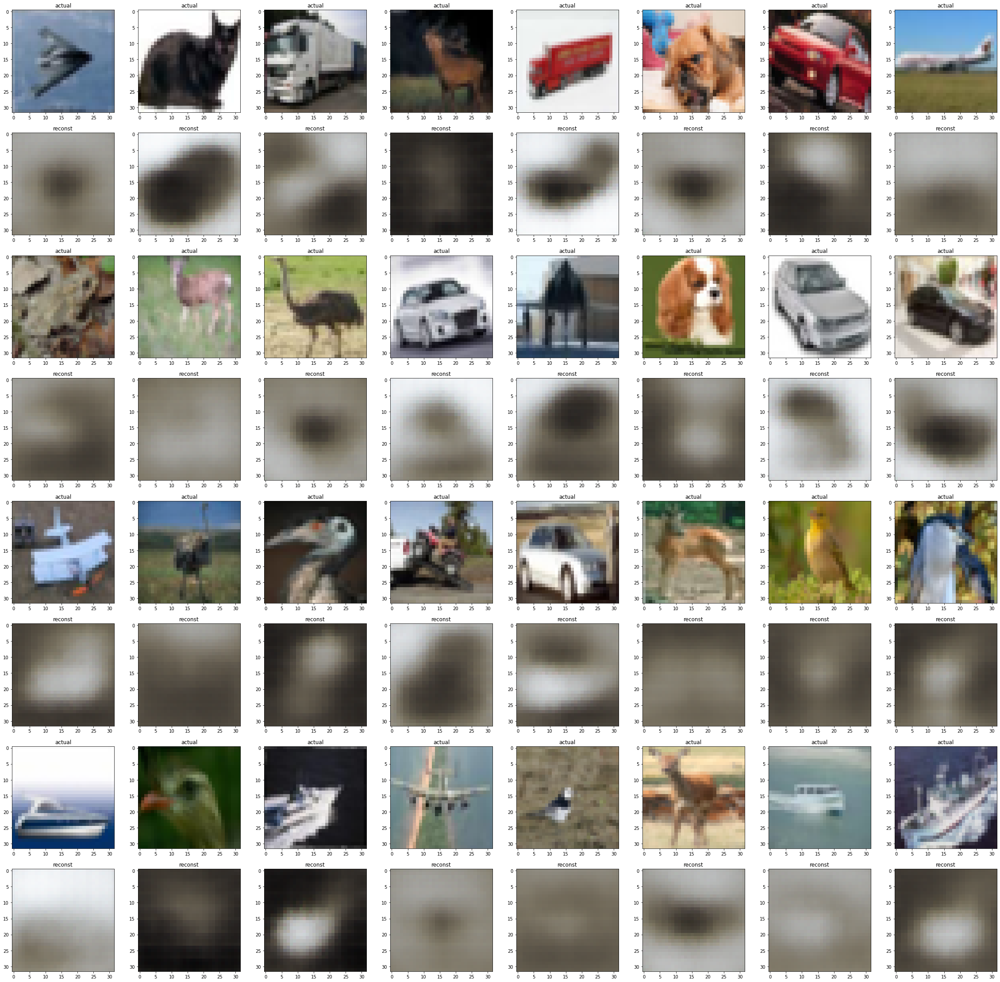

In [21]:
model.cpu()
f, axs = plt.subplots(8, 8, figsize = (40, 40))
z, y = model.get_latents(x)
reconsts = model.dec(torch.cat((z, y), dim=1))
for i in range(32):
    row = 2*(i//8)
    col = i%8
    axs[row][col].imshow(x[i].permute(1, 2, 0).detach())
    axs[row][col].set_title('actual')
    axs[row+1][col].imshow(reconsts[i].permute(1, 2, 0).detach())
    axs[row+1][col].set_title('reconst')

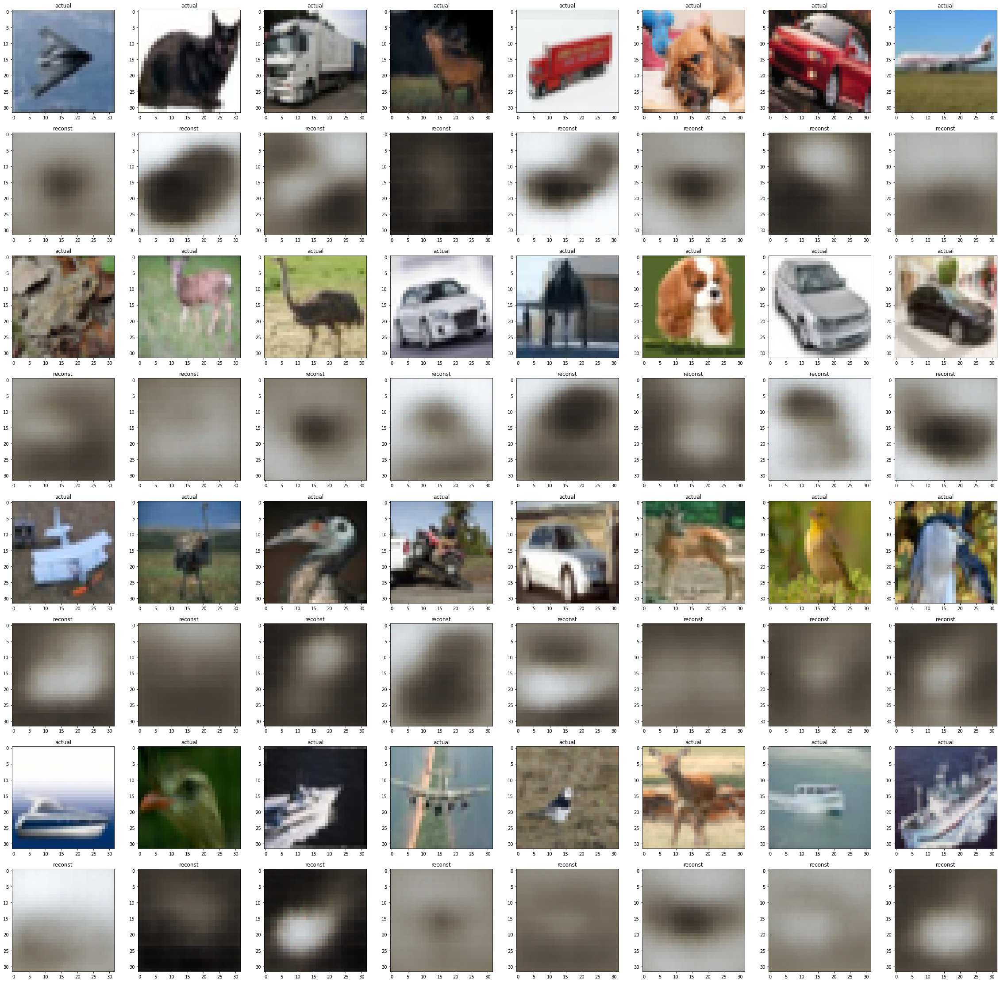

In [22]:
f, axs = plt.subplots(8, 8, figsize = (40, 40))

z, y = model.get_latents(x)
alter_y = torch.zeros_like(y[0])
alter_y[1] = 1
for i in range(len(y)):
    y[i] = alter_y

reconsts = model.dec(torch.cat((z, y), dim=1))

for i in range(32):
    row = 2*(i//8)
    col = i%8
    axs[row][col].imshow(x[i].permute(1, 2, 0).detach())
    axs[row][col].set_title('actual')
    axs[row+1][col].imshow(reconsts[i].permute(1, 2, 0).detach())
    axs[row+1][col].set_title('reconst')

# Pretrain semisupervised CIFAR10

In [23]:
model = AAE.make_model(512, 1000, 2, 10, 8, 1000, 2, 128, 2, 128, 2, dropout_rate=dropout_rate)

learning_rate = 1e-3
momentum=0.8

optims_scheds = {}
optim_reconst = optim.SGD(list(model.enc.parameters()) + list(model.dec.parameters()), lr=learning_rate*10, momentum=momentum)
lr_re = torch.optim.lr_scheduler.CosineAnnealingLR(optim_reconst, T_max=len(train_dl)*num_epochs)
# lr_re = None
optims_scheds['reconst'] = (optim_reconst, lr_re)

optim_discz = optim.SGD(model.d_z.parameters(), lr=learning_rate, momentum=momentum)
lr_dz = torch.optim.lr_scheduler.CosineAnnealingLR(optim_discz, T_max=len(train_dl)*num_epochs)
# lr_dz = None
optims_scheds['disc_z'] = (optim_discz, lr_dz)

optim_discy = optim.SGD(model.d_y.parameters(), lr=learning_rate, momentum=momentum)
lr_dy = torch.optim.lr_scheduler.CosineAnnealingLR(optim_discy, T_max=len(train_dl)*num_epochs)
# lr_dy = None
optims_scheds['disc_y'] = (optim_discy, lr_dy)

enc_params = list(model.enc.input_block.parameters())
enc_params += list(model.enc.blocks.parameters())
enc_params += list(model.enc.z_block.parameters())
optim_enc = optim.SGD(enc_params, lr=learning_rate, momentum=momentum)
lr_en = torch.optim.lr_scheduler.CosineAnnealingLR(optim_enc, T_max=len(train_dl)*num_epochs)
# lr_en = None
optims_scheds['enc'] = (optim_enc, lr_en)

y_params = list(model.enc.y_block.parameters()) \
            + list(model.enc.input_block.parameters()) \
            + list(model.enc.blocks.parameters())
optim_y = optim.SGD(y_params, lr=learning_rate, momentum=momentum)
lr_y = torch.optim.lr_scheduler.CosineAnnealingLR(optim_y, T_max=len(train_dl)*num_epochs)
# lr_y = None
optims_scheds['y_'] = (optim_y, lr_y)

In [24]:
# train(model, train_dl, num_epochs, device, optim_sched, verbose_freq=50, save=True, cache_dir=None, val_dl=None):
torch.autograd.set_detect_anomaly(False)
epoch_history, batch_history = train(model, train_dl, num_epochs, device, optims_scheds,
                                     verbose_freq=100,
                                     cache_dir = '.\\cache',
                                     val_dl=val_dl,
                                     pretraining=True,
                                     model_name='CIFAR10_semisup'
                                     )

60 Train:
|    reconst    | : 5.734410
|    disc_y     | : nan
|    disc_z     | : nan
|      enc      | : nan
|      y_       | : 22.059509
|    z_d_acc    | : nan
|    y_d_acc    | : nan
|     y_acc     | : 0.902036
Epoch 60 Val:
|    reconst    | : 6.686991
|    disc_y     | : nan
|    disc_z     | : nan
|      enc      | : nan
|      y_       | : 21.918781
|    z_d_acc    | : nan
|    y_d_acc    | : nan
|     y_acc     | : 0.903242
Epoch 60 - time taken: 9.469993829727173
Epoch 61 Train:
|    reconst    | : 5.720643
|    disc_y     | : nan
|    disc_z     | : nan
|      enc      | : nan
|      y_       | : 22.055703
|    z_d_acc    | : nan
|    y_d_acc    | : nan
|     y_acc     | : 0.902182
Epoch 61 Val:
|    reconst    | : 6.656077
|    disc_y     | : nan
|    disc_z     | : nan
|      enc      | : nan
|      y_       | : 21.925147
|    z_d_acc    | : nan
|    y_d_acc    | : nan
|     y_acc     | : 0.903187
Epoch 61 - time taken: 9.329999446868896
Epoch 62 Train:
|    reconst    

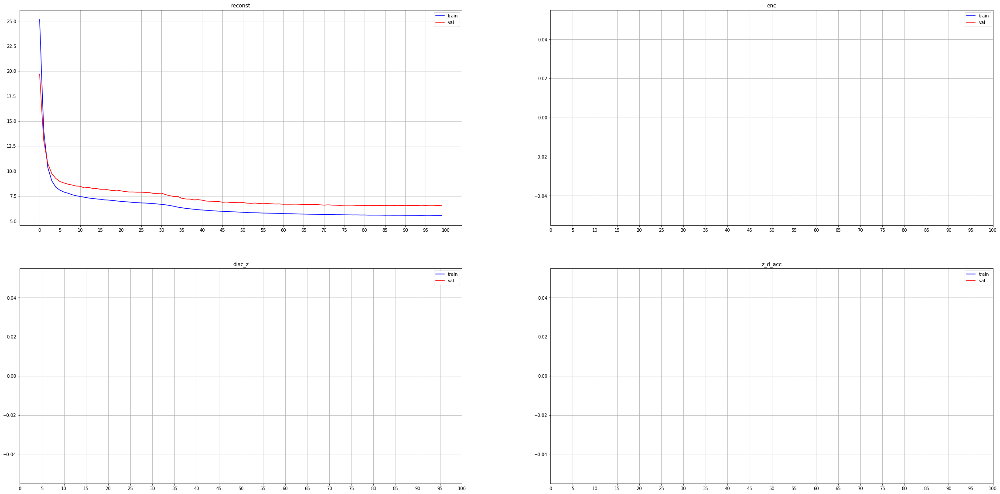

In [25]:
show_results(epoch_history, batch_history)

In [24]:
with open('.\\cache\\savestates\\CIFAR10_semisup_pretrain_80.pkl', 'rb') as f:
    save_state = torch.load(f)
    f.close()
model.load_state_dict(save_state['state_dict'])

<All keys matched successfully>

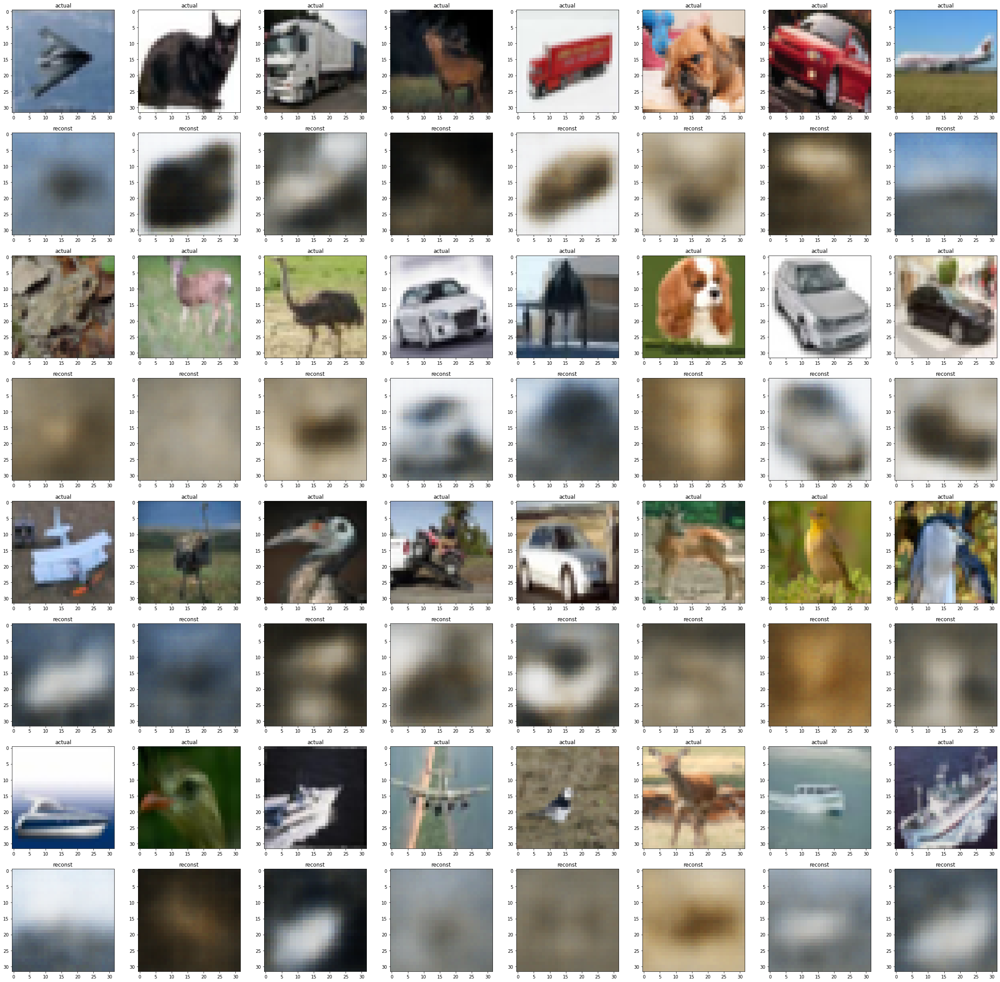

In [26]:
model.cpu()
f, axs = plt.subplots(8, 8, figsize = (40, 40))
z, y = model.get_latents(x)
reconsts = model.dec(torch.cat((z, y), dim=1))
for i in range(32):
    row = 2*(i//8)
    col = i%8
    axs[row][col].imshow(x[i].permute(1, 2, 0).detach())
    axs[row][col].set_title('actual')
    axs[row+1][col].imshow(reconsts[i].permute(1, 2, 0).detach())
    axs[row+1][col].set_title('reconst')

In [25]:
learning_rate = 1e-3
momentum=0.8

optims_scheds = {}
optim_reconst = optim.SGD(list(model.enc.parameters()) + list(model.dec.parameters()), lr=learning_rate*10, momentum=momentum)
lr_re = torch.optim.lr_scheduler.CosineAnnealingLR(optim_reconst, T_max=len(train_dl)*num_epochs)
# lr_re = None
optims_scheds['reconst'] = (optim_reconst, lr_re)

optim_discz = optim.SGD(model.d_z.parameters(), lr=learning_rate, momentum=momentum)
lr_dz = torch.optim.lr_scheduler.CosineAnnealingLR(optim_discz, T_max=len(train_dl)*num_epochs)
# lr_dz = None
optims_scheds['disc_z'] = (optim_discz, lr_dz)

optim_discy = optim.SGD(model.d_y.parameters(), lr=learning_rate, momentum=momentum)
lr_dy = torch.optim.lr_scheduler.CosineAnnealingLR(optim_discy, T_max=len(train_dl)*num_epochs)
# lr_dy = None
optims_scheds['disc_y'] = (optim_discy, lr_dy)

enc_params = list(model.enc.input_block.parameters())
enc_params += list(model.enc.blocks.parameters())
enc_params += list(model.enc.z_block.parameters())
optim_enc = optim.SGD(enc_params, lr=learning_rate, momentum=momentum)
lr_en = torch.optim.lr_scheduler.CosineAnnealingLR(optim_enc, T_max=len(train_dl)*num_epochs)
# lr_en = None
optims_scheds['enc'] = (optim_enc, lr_en)

y_params = list(model.enc.y_block.parameters()) \
            + list(model.enc.input_block.parameters()) \
            + list(model.enc.blocks.parameters())
optim_y = optim.SGD(y_params, lr=learning_rate, momentum=momentum)
lr_y = torch.optim.lr_scheduler.CosineAnnealingLR(optim_y, T_max=len(train_dl)*num_epochs)
# lr_y = None
optims_scheds['y_'] = (optim_y, lr_y)

In [26]:
# train(model, train_dl, num_epochs, device, optim_sched, verbose_freq=50, save=True, cache_dir=None, val_dl=None):
torch.autograd.set_detect_anomaly(False)
epoch_history, batch_history = train(model, train_dl, num_epochs, device, optims_scheds,
                                     verbose_freq=100,
                                     cache_dir = '.\\cache',
                                     val_dl=val_dl,
                                     pretraining=False,
                                     model_name='CIFAR10_semisup_finetune'
                                     )

h 47 Val:
|    reconst    | : 5.938542
|    disc_y     | : 0.066058
|    disc_z     | : 1.146271
|      enc      | : 3.842317
|      y_       | : 2.264560
|    z_d_acc    | : [0.83169842 0.79276347]
|    y_d_acc    | : [0.99873047 1.        ]
|     y_acc     | : 0.900042
Epoch 47 - time taken: 12.39799451828003
Epoch 48 Train:
|    reconst    | : 5.034086
|    disc_y     | : 0.073279
|    disc_z     | : 1.127704
|      enc      | : 5.756306
|      y_       | : 2.270117
|    z_d_acc    | : [0.82439101 0.7874818 ]
|    y_d_acc    | : [0.99762835 1.        ]
|     y_acc     | : 0.900047
Epoch 48 Val:
|    reconst    | : 6.004823
|    disc_y     | : 0.064710
|    disc_z     | : 1.138603
|      enc      | : 3.877930
|      y_       | : 2.266487
|    z_d_acc    | : [0.82733976 0.80043247]
|    y_d_acc    | : [0.99850526 1.        ]
|     y_acc     | : 0.900023
Epoch 48 - time taken: 14.028993129730225
Epoch 49 Train:
|    reconst    | : 5.030226
|    disc_y     | : 0.071232
|    disc_z     |

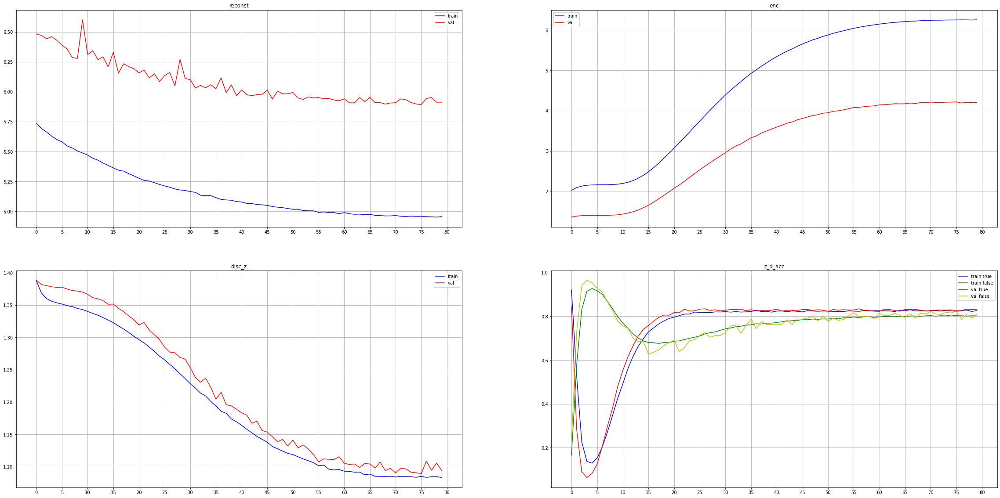

In [27]:
show_results(epoch_history, batch_history)

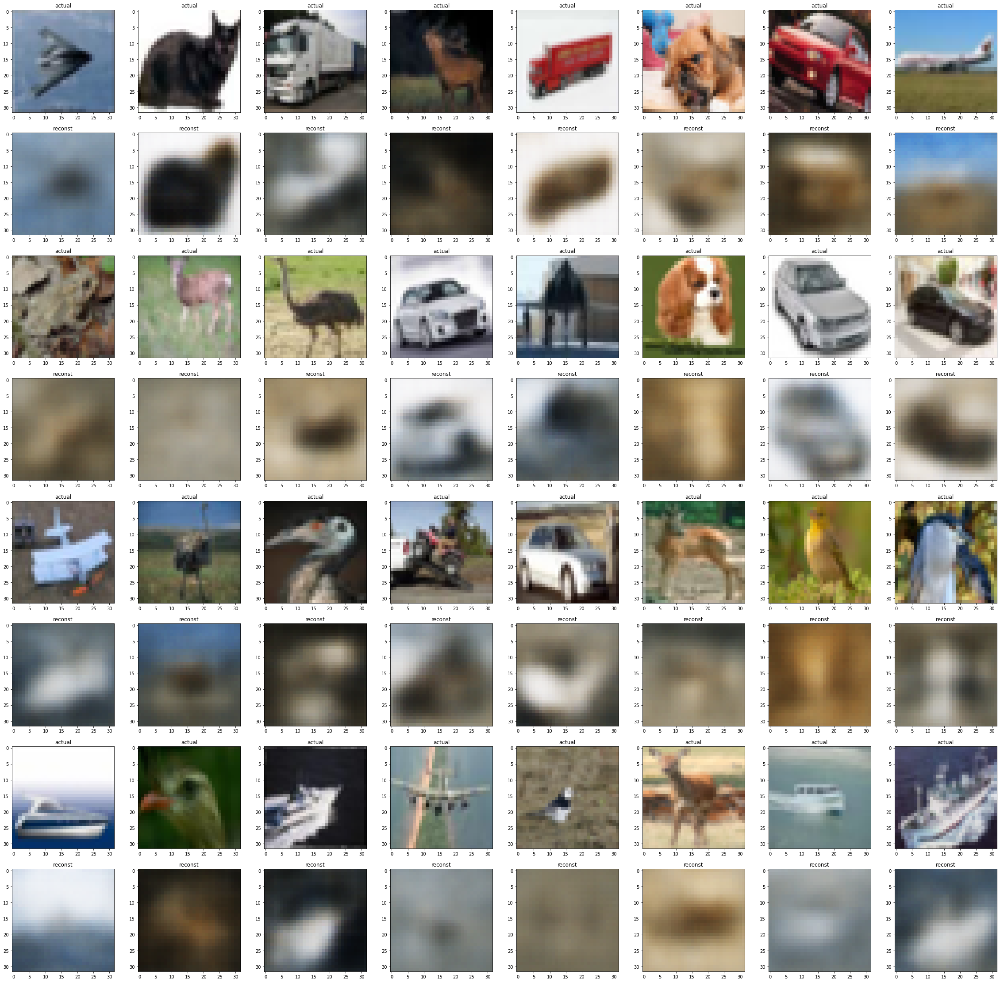

In [28]:
model.cpu()
f, axs = plt.subplots(8, 8, figsize = (40, 40))
z, y = model.get_latents(x)
reconsts = model.dec(torch.cat((z, y), dim=1))
for i in range(32):
    row = 2*(i//8)
    col = i%8
    axs[row][col].imshow(x[i].permute(1, 2, 0).detach())
    axs[row][col].set_title('actual')
    axs[row+1][col].imshow(reconsts[i].permute(1, 2, 0).detach())
    axs[row+1][col].set_title('reconst')

# Pretraining Unsupervised CIFAR10

In [14]:
model = AAE.make_model(512, 1000, 2, 10, 8, 1000, 2, 128, 2, 128, 2, dropout_rate=dropout_rate)

learning_rate = 1e-3
momentum=0.8

optims_scheds = {}
optim_reconst = optim.SGD(list(model.enc.parameters()) + list(model.dec.parameters()), lr=learning_rate*10, momentum=momentum)
lr_re = torch.optim.lr_scheduler.CosineAnnealingLR(optim_reconst, T_max=len(train_dl)*num_epochs)
# lr_re = None
optims_scheds['reconst'] = (optim_reconst, lr_re)

optim_discz = optim.SGD(model.d_z.parameters(), lr=learning_rate, momentum=momentum)
lr_dz = torch.optim.lr_scheduler.CosineAnnealingLR(optim_discz, T_max=len(train_dl)*num_epochs)
# lr_dz = None
optims_scheds['disc_z'] = (optim_discz, lr_dz)

optim_discy = optim.SGD(model.d_y.parameters(), lr=learning_rate, momentum=momentum)
lr_dy = torch.optim.lr_scheduler.CosineAnnealingLR(optim_discy, T_max=len(train_dl)*num_epochs)
# lr_dy = None
optims_scheds['disc_y'] = (optim_discy, lr_dy)

enc_params = list(model.enc.input_block.parameters())
enc_params += list(model.enc.blocks.parameters())
enc_params += list(model.enc.z_block.parameters())
optim_enc = optim.SGD(enc_params, lr=learning_rate, momentum=momentum)
lr_en = torch.optim.lr_scheduler.CosineAnnealingLR(optim_enc, T_max=len(train_dl)*num_epochs)
# lr_en = None
optims_scheds['enc'] = (optim_enc, lr_en)

y_params = list(model.enc.y_block.parameters()) \
            + list(model.enc.input_block.parameters()) \
            + list(model.enc.blocks.parameters())
optim_y = optim.SGD(y_params, lr=learning_rate, momentum=momentum)
lr_y = torch.optim.lr_scheduler.CosineAnnealingLR(optim_y, T_max=len(train_dl)*num_epochs)
# lr_y = None
optims_scheds['y_'] = (optim_y, lr_y)

In [15]:
# train(model, train_dl, num_epochs, device, optim_sched, verbose_freq=50, save=True, cache_dir=None, val_dl=None):
torch.autograd.set_detect_anomaly(False)
epoch_history, batch_history = train(model, train_dl, num_epochs, device, optims_scheds,
                                     verbose_freq=100,
                                     cache_dir = '.\\cache',
                                     val_dl=val_dl,
                                     pretraining=True,
                                     model_name='CIFAR10',
                                     semisup=False
                                     )

t    | : 5.711508
|    disc_y     | : nan
|    disc_z     | : nan
|      enc      | : nan
|      y_       | : nan
|    z_d_acc    | : nan
|    y_d_acc    | : nan
|     y_acc     | : nan
Epoch 59 Val:
|    reconst    | : 6.659179
|    disc_y     | : nan
|    disc_z     | : nan
|      enc      | : nan
|      y_       | : 23.120046
|    z_d_acc    | : nan
|    y_d_acc    | : nan
|     y_acc     | : 0.896949
Epoch 59 - time taken: 4.290994882583618
Epoch 60 Train:
|    reconst    | : 5.703040
|    disc_y     | : nan
|    disc_z     | : nan
|      enc      | : nan
|      y_       | : nan
|    z_d_acc    | : nan
|    y_d_acc    | : nan
|     y_acc     | : nan
Epoch 60 Val:
|    reconst    | : 6.668925
|    disc_y     | : nan
|    disc_z     | : nan
|      enc      | : nan
|      y_       | : 23.112074
|    z_d_acc    | : nan
|    y_d_acc    | : nan
|     y_acc     | : 0.897446
Epoch 60 - time taken: 4.161998987197876
Epoch 61 Train:
|    reconst    | : 5.689568
|    disc_y     | : nan
|    d

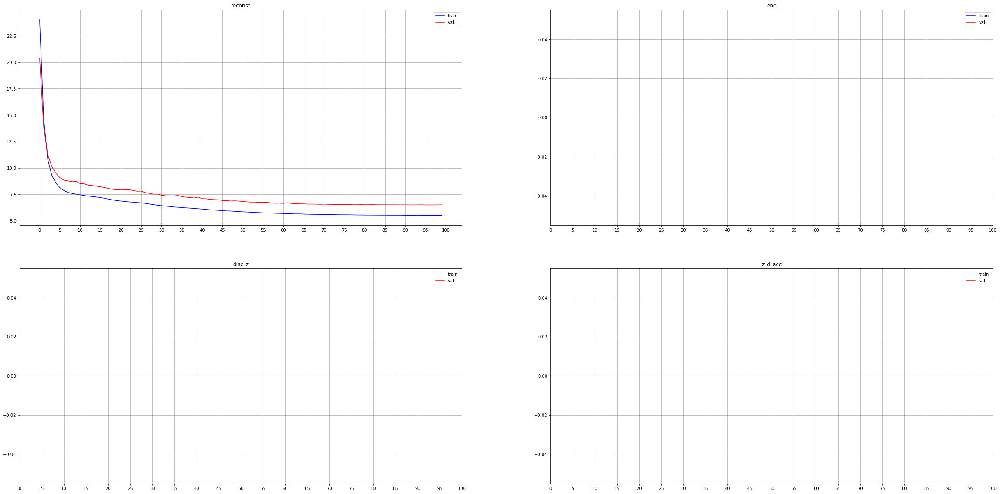

In [18]:
show_results(epoch_history, batch_history)

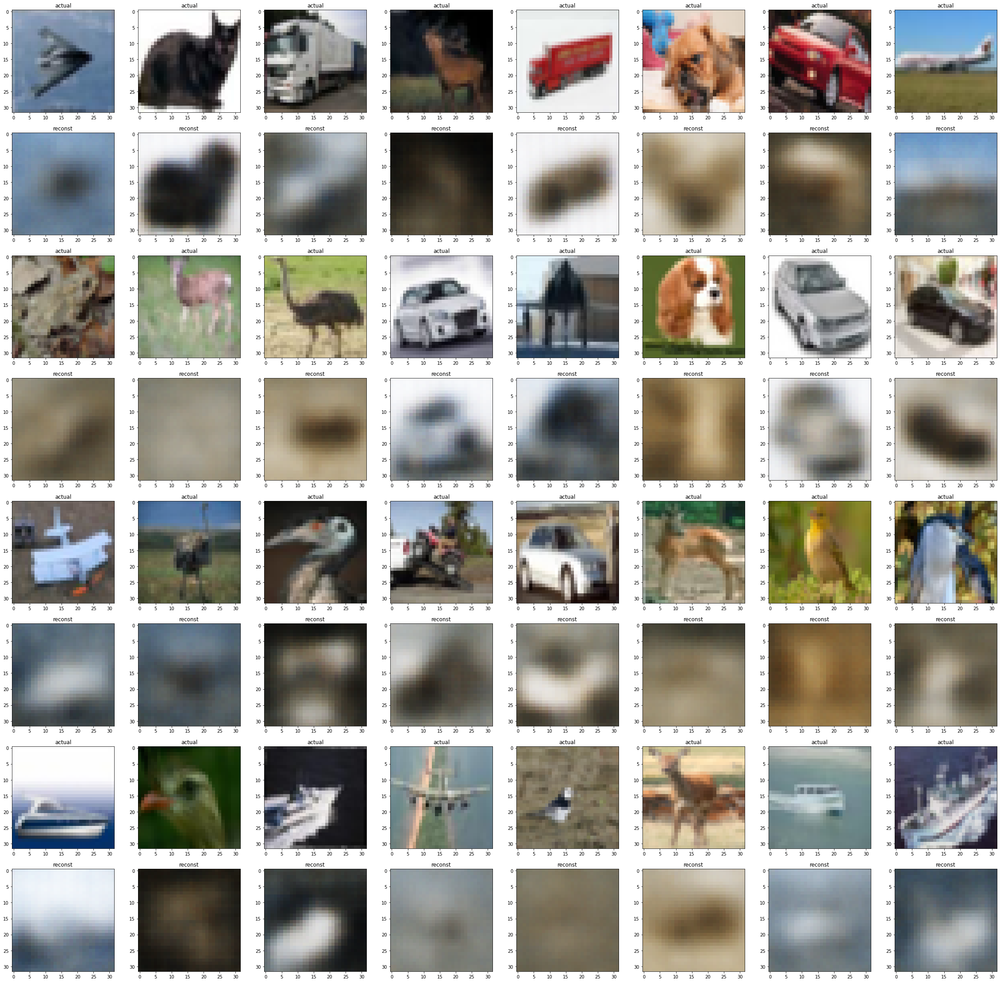

In [16]:
model.cpu()
f, axs = plt.subplots(8, 8, figsize = (40, 40))
z, y = model.get_latents(x)
reconsts = model.dec(torch.cat((z, y), dim=1))
for i in range(32):
    row = 2*(i//8)
    col = i%8
    axs[row][col].imshow(x[i].permute(1, 2, 0).detach())
    axs[row][col].set_title('actual')
    axs[row+1][col].imshow(reconsts[i].permute(1, 2, 0).detach())
    axs[row+1][col].set_title('reconst')

In [19]:
num_epochs = 80
learning_rate = 1e-3
momentum=0.9

In [20]:
optims_scheds = {}
optim_reconst = optim.Adam(list(model.enc.parameters()) + list(model.dec.parameters()), lr = learning_rate*10)
lr_re = torch.optim.lr_scheduler.OneCycleLR(optim_reconst, learning_rate, total_steps=len(train_dl)*num_epochs)
lr_re = None
optims_scheds['reconst'] = (optim_reconst, lr_re)

optim_discz = optim.Adam(model.d_z.parameters(), lr=learning_rate)
lr_dz = torch.optim.lr_scheduler.OneCycleLR(optim_discz, learning_rate, total_steps=len(train_dl)*num_epochs)
lr_dz = None
optims_scheds['disc_z'] = (optim_discz, lr_dz)

optim_discy = optim.Adam(model.d_y.parameters(), lr=learning_rate)
lr_dy = torch.optim.lr_scheduler.OneCycleLR(optim_discy, learning_rate, total_steps=len(train_dl)*num_epochs)
lr_dy = None
optims_scheds['disc_y'] = (optim_discy, lr_dy)

enc_params = list(model.enc.input_block.parameters())
enc_params += list(model.enc.blocks.parameters())
enc_params += list(model.enc.z_block.parameters())
optim_enc = optim.Adam(enc_params, lr=learning_rate)
lr_en = torch.optim.lr_scheduler.OneCycleLR(optim_enc, learning_rate, total_steps=len(train_dl)*num_epochs)
lr_en = None
optims_scheds['enc'] = (optim_enc, lr_en)

y_params = list(model.enc.y_block.parameters()) \
            + list(model.enc.input_block.parameters()) \
            + list(model.enc.blocks.parameters())
optim_y = optim.Adam(y_params, lr=learning_rate)
lr_y = torch.optim.lr_scheduler.OneCycleLR(optim_y, learning_rate*10, total_steps=len(train_dl)*num_epochs)
lr_y = None
optims_scheds['y_'] = (optim_y, lr_y)

In [21]:
# train(model, train_dl, num_epochs, device, optim_sched, verbose_freq=50, save=True, cache_dir=None, val_dl=None):
torch.autograd.set_detect_anomaly(False)
epoch_history, batch_history = train(model, train_dl, num_epochs, device, optims_scheds,
                                     verbose_freq=100,
                                     cache_dir = '.\\cache',
                                     val_dl=val_dl,
                                     pretraining=False,
                                     model_name='CIFAR10_finetune'
                                     )

 1.        ]
|     y_acc     | : 0.969944
Epoch 47 Val:
|    reconst    | : 7.987020
|    disc_y     | : 0.004267
|    disc_z     | : 1.385246
|      enc      | : 6.943438
|      y_       | : 1.816798
|    z_d_acc    | : [0.61072624 0.40978157]
|    y_d_acc    | : [0.99938416 1.        ]
|     y_acc     | : 0.929136
Epoch 47 - time taken: 14.006003141403198
Epoch 48 Train:
|    reconst    | : 6.841574
|    disc_y     | : 0.005412
|    disc_z     | : 1.387109
|      enc      | : 10.210742
|      y_       | : 1.658708
|    z_d_acc    | : [0.52885045 0.45699971]
|    y_d_acc    | : [0.99944196 1.        ]
|     y_acc     | : 0.970489
Epoch 48 Val:
|    reconst    | : 7.945991
|    disc_y     | : 0.003607
|    disc_z     | : 1.384481
|      enc      | : 7.003576
|      y_       | : 1.814961
|    z_d_acc    | : [0.46073222 0.56786113]
|    y_d_acc    | : [0.99960938 1.        ]
|     y_acc     | : 0.929730
Epoch 48 - time taken: 15.533998966217041
Epoch 49 Train:
|    reconst    | : 6.81352

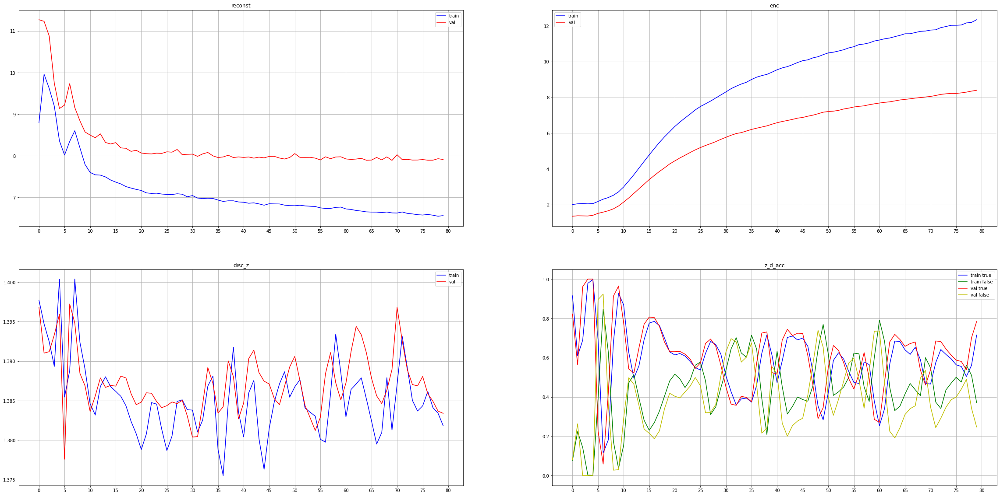

In [22]:
show_results(epoch_history, batch_history)

# OOD experiments

Use the training regime with semisupervised pretraining

In [29]:
with open('.\\cache\\savestates\\CIFAR10_semisup_finetune_80.pkl', 'rb') as f:
    save_state = torch.load(f)
    f.close()
model.load_state_dict(save_state['state_dict'])

<All keys matched successfully>

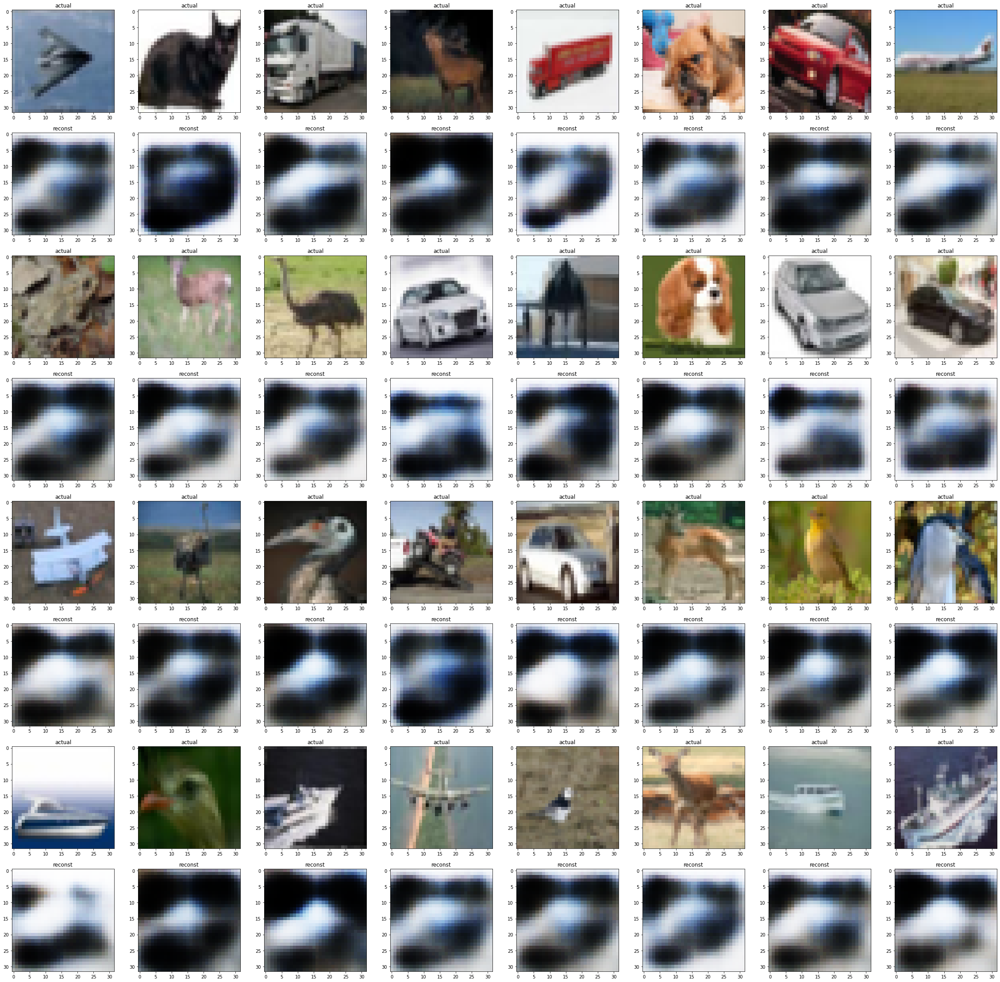

In [108]:
f, axs = plt.subplots(8, 8, figsize = (40, 40))

z, y = model.get_latents(x)
alter_y = torch.zeros_like(y[0])
alter_y[1] = 1
for i in range(len(y)):
    y[i] = alter_y

reconsts = model.dec(torch.cat((z, y), dim=1))

for i in range(32):
    row = 2*(i//8)
    col = i%8
    axs[row][col].imshow(x[i].permute(1, 2, 0).detach())
    axs[row][col].set_title('actual')
    axs[row+1][col].imshow(reconsts[i].permute(1, 2, 0).detach())
    axs[row+1][col].set_title('reconst')

## Calibration

<AxesSubplot:ylabel='Density'>

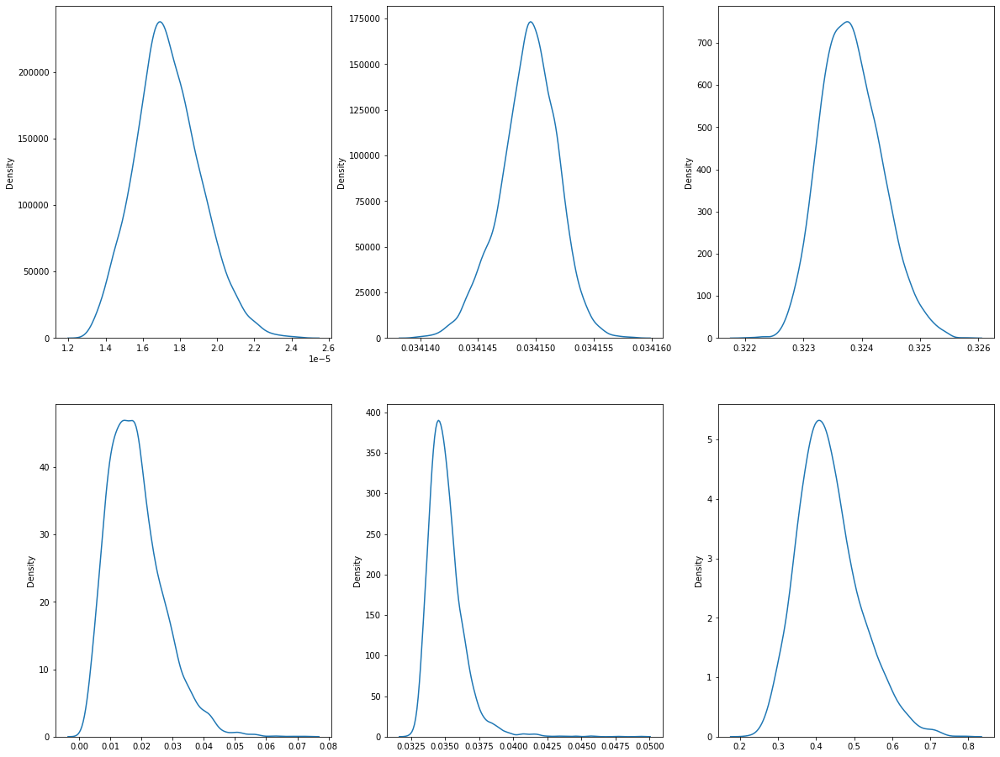

In [37]:
cal_lim = []
test_lim = []
cal_pz = []
cal_py = []
test_pz = []
test_py = []
model.eval()
model.to(device)

for _, xs, ys in iter(cal_dl):
    xs = xs.to(device)
    ys = ys.to(device)
    reconst = model.get_reconst(xs)
    z, y_ = model.get_latents(xs)

    pz = model.discriminate(z, 'z')
    py = model.discriminate(y_, 'y')
    cal_lim.append(F.mse_loss(reconst, xs, reduction='mean').item())
    cal_py.append(py.detach().cpu().item())
    cal_pz.append(pz.detach().cpu().item())

for _, xs, ys in iter(test_dl):
    xs = xs.to(device)
    ys = ys.to(device)
    reconst = model.get_reconst(xs)
    z, y_ = model.get_latents(xs)

    pz = model.discriminate(z, 'z')
    py = model.discriminate(y_, 'y')
    test_lim.append(F.mse_loss(reconst, xs, reduction='mean').item())
    test_py.append(py.detach().cpu().item())
    test_pz.append(pz.detach().cpu().item())

model.cpu()

_, axs = plt.subplots(2, 3, figsize=(20, 16))
sns.kdeplot(cal_lim, ax=axs[0, 0])
sns.kdeplot(cal_py, ax=axs[0, 1])
sns.kdeplot(cal_pz, ax=axs[0, 2])
sns.kdeplot(test_lim, ax=axs[1, 0])
sns.kdeplot(test_py, ax=axs[1, 1])
sns.kdeplot(test_pz, ax=axs[1, 2])

In [38]:
cal_lim = np.mean(cal_lim)
test_lim = np.mean(test_lim)
cal_pz = np.mean(cal_pz)
cal_py = np.mean(cal_py)
test_pz = np.mean(test_pz)
test_py = np.mean(test_py)

cal_pys = []
cal_pzs = []
train_pys = []
train_pzs = []
for x, _, _ in tqdm(test_dl):
    z, y = model.get_latents(x)
    pz = model.discriminate(z, 'z')
    py = model.discriminate(y, 'y')
    cal_pys.append(py.item())
    cal_pzs.append(pz.item())

for x, _, _ in tqdm(train_dl):
    z, y = model.get_latents(x)
    pz = model.discriminate(z, 'z')
    py = model.discriminate(y, 'y')
    train_pzs += (p.item() for p in pz)
    train_pys += (p.item() for p in py)

  0%|          | 0/5000 [00:00<?, ?it/s]d:\venvs\pytorch-cv\lib\site-packages\torch\nn\modules\container.py:119: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)
100%|██████████| 35/35 [00:05<00:00,  5.85it/s]


## OOD - Noise

Expectations: z should be a stronger OOD detector whereas y shouldn't be able to detect OOD (assuming proper disentanglement)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

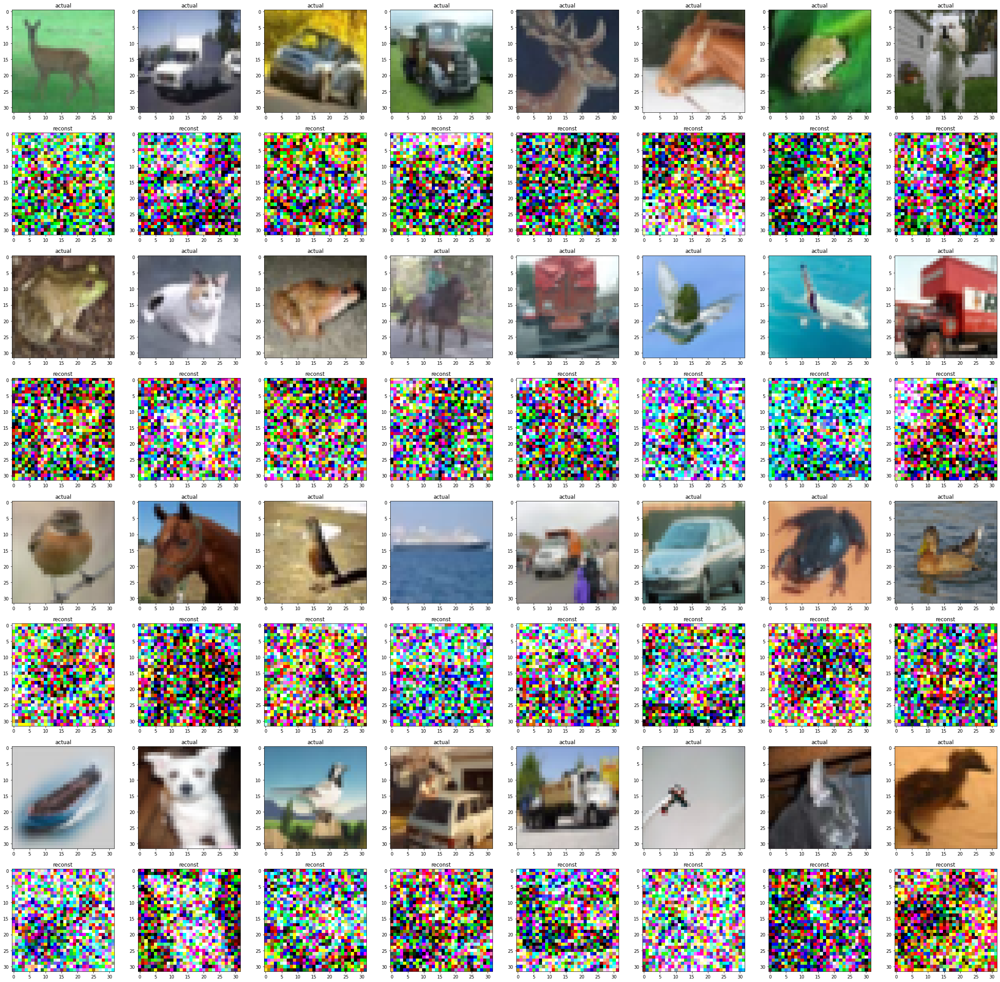

In [40]:
x, _, _ = next(iter(val_dl))
ood_batch = x+0.6*torch.randn(x.shape)

f, axs = plt.subplots(8, 8, figsize = (40, 40))

for i in range(32):
    row = 2*(i//8)
    col = i%8
    axs[row][col].imshow(x[i].permute(1, 2, 0).detach())
    axs[row][col].set_title('actual')
    axs[row+1][col].imshow(ood_batch[i].permute(1, 2, 0).detach())
    axs[row+1][col].set_title('reconst')

d:\venvs\pytorch-cv\lib\site-packages\torch\nn\modules\container.py:119: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


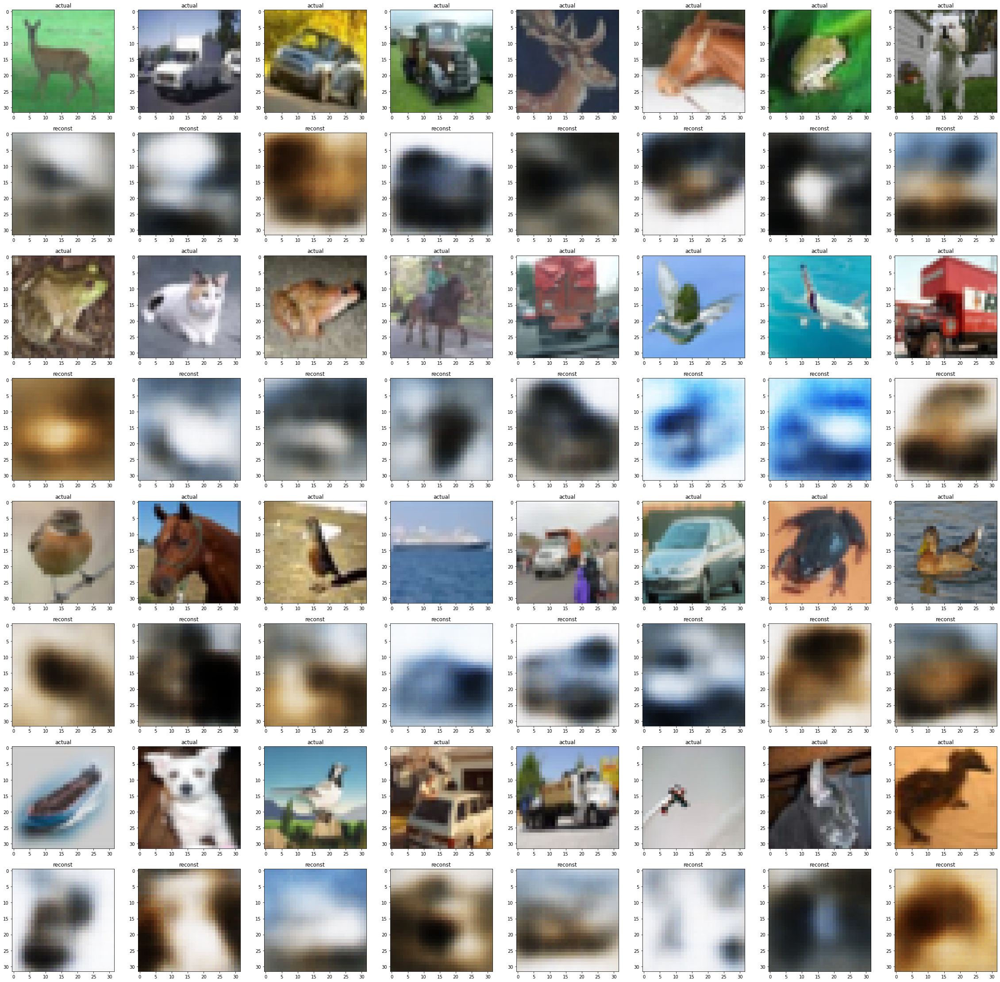

In [42]:
# x, _, _ = next(iter(val_dl))
ood_batch = x+0.6*torch.randn(x.shape)

f, axs = plt.subplots(8, 8, figsize = (40, 40))

reconsts = model.get_reconst(ood_batch)

for i in range(32):
    row = 2*(i//8)
    col = i%8
    axs[row][col].imshow(x[i].permute(1, 2, 0).detach())
    axs[row][col].set_title('actual')
    axs[row+1][col].imshow(reconsts[i].permute(1, 2, 0).detach())
    axs[row+1][col].set_title('reconst')

In [45]:
zscore = 0
yscore = 0
pys = []
pzs = []
for x, _, _ in tqdm(test_dl):
    x = x+0.6*torch.randn_like(x)
    z, y = model.get_latents(x)
    pz = model.discriminate(z, 'z')
    py = model.discriminate(y, 'y')
    zscore += sum(pz > test_pz)
    yscore += sum(py > test_py)
    pys.append(py.item())
    pzs.append(pz.item())

print()
print(zscore/(len(test_dl)))
print(yscore/(len(test_dl)))

c_score = 0
t_score = 0
model.to(device)

for _, xs, ys in tqdm(iter(test_dl)):
    xs += 0.6*torch.randn_like(xs)
    xs = xs.to(device)
    ys = ys.to(device)
    reconst = model.get_reconst(xs)
    l = F.mse_loss(reconst, xs, reduction='sum')/xs.size(0)
    if l>cal_lim:
        c_score += 1
    if l>test_lim:
        t_score += 1

model.cpu()

print()
print(c_score/len(test_dl))
print(t_score/len(test_dl))

  0%|          | 13/5000 [00:00<00:39, 125.00it/s]
tensor([0.7314])
tensor([0.5294])
100%|██████████| 5000/5000 [00:34<00:00, 143.62it/s]
1.0
1.0



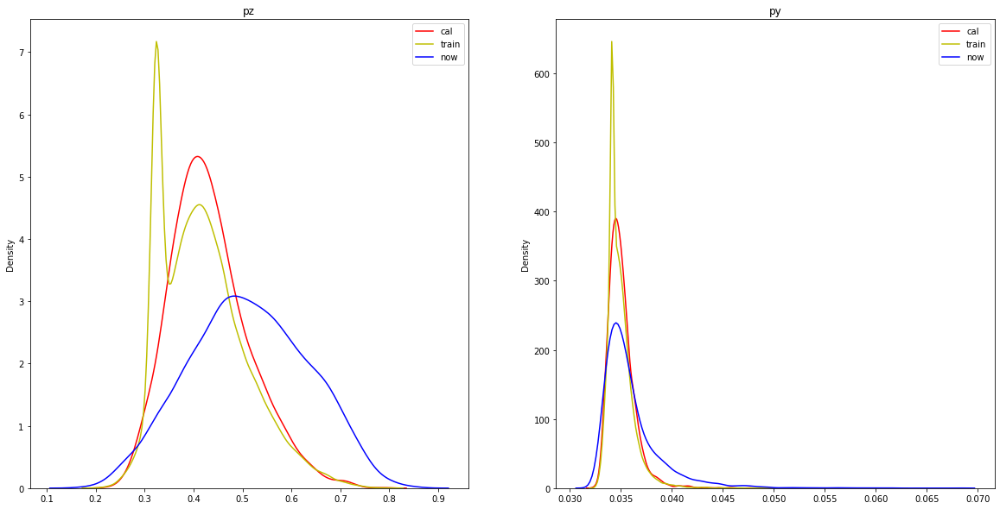

In [46]:
_, axs = plt.subplots(1, 2, figsize=(20, 10))

sns.kdeplot(cal_pzs, ax=axs[0], color='r', label='cal')
sns.kdeplot(train_pzs, ax=axs[0], color='y', label='train')
sns.kdeplot(pzs, ax=axs[0], color='b', label='now')
axs[0].set_title('pz')
axs[0].legend()

sns.kdeplot(cal_pys, ax=axs[1], color='r', label='cal')
sns.kdeplot(train_pys, ax=axs[1], color='y', label='train')
sns.kdeplot(pys, ax=axs[1], color='b', label='now')
axs[1].set_title('py')
axs[1].legend()

plt.show()

## Double Clean

Expectations: Z should be fine (assuming handwriting encoded), Y should fail

In [47]:
from torchvision import transforms

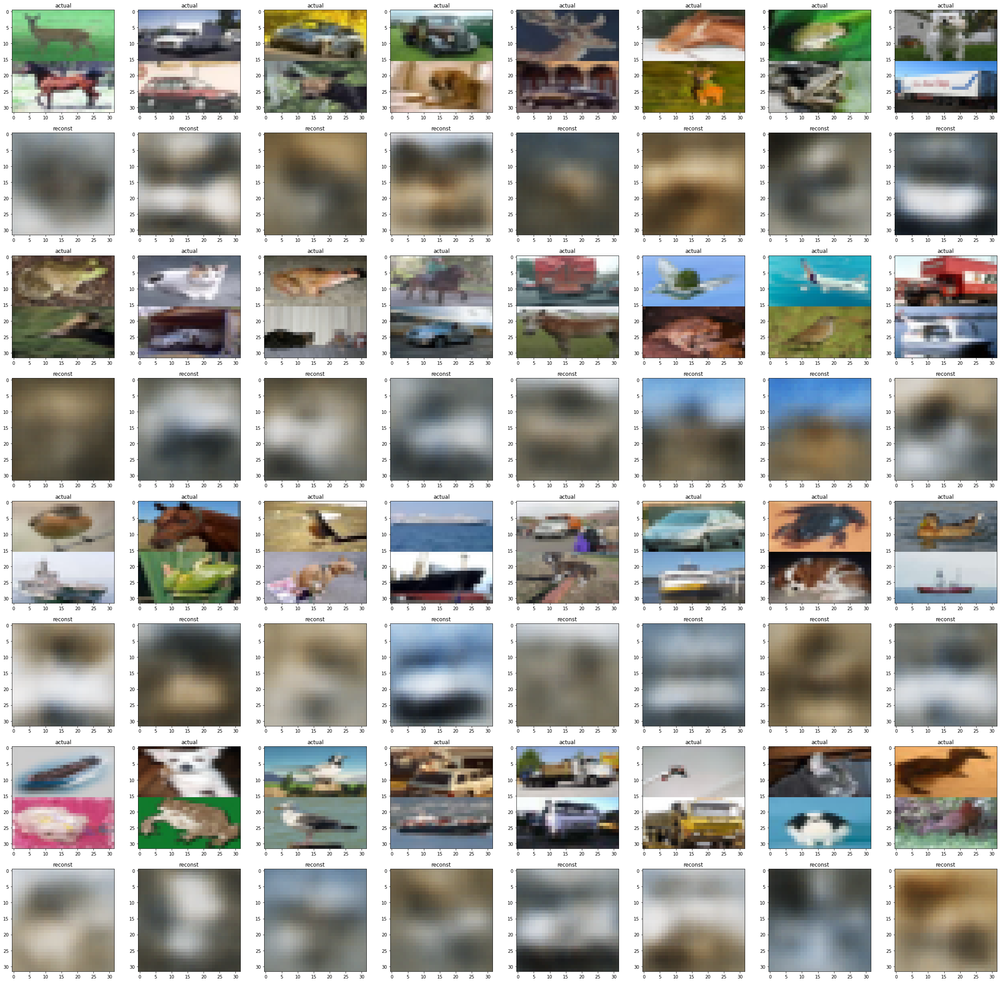

In [61]:
val_iter = iter(val_dl)
x1, _, _ = next(val_iter)
x2, _, _ = next(val_iter)

f, axs = plt.subplots(8, 8, figsize = (40, 40))
resize = transforms.Resize((32, 32))

for i in range(32):
    row = 2*(i//8)
    col = i%8
    im = torch.hstack((x1[i], x2[i]))
    im = resize(im)
    axs[row][col].imshow(im.permute(1, 2, 0).detach())
    axs[row][col].set_title('actual')
    reconsts = model.get_reconst(im.unsqueeze(0))[0]
    axs[row+1][col].imshow(reconsts.permute(1, 2, 0).detach())
    axs[row+1][col].set_title('reconst')

In [76]:
model.to(device)
zscore = 0
yscore = 0
pys = []
pzs = []
ood_iter = iter(test_dl)
for _ in tqdm(range(len(test_dl)//2)):
    # try:
    x1, _, _ = next(ood_iter)
    x2, _, _ = next(ood_iter)
    im = torch.hstack((x1[0], x2[0]))
    im = resize(im)
    im = im.to(device)
    z, y = model.get_latents(im.unsqueeze(0))
    pz = model.discriminate(z, 'z')
    py = model.discriminate(y, 'y')
    zscore += sum(pz > test_pz)
    yscore += sum(py > test_py)
    pys.append(py.item())
    pzs.append(pz.item())
    # except:
    #     break

print()
print(zscore/(len(test_dl)))
print(yscore/(len(test_dl)))

c_score = 0
t_score = 0

ood_iter = iter(test_dl)
for _ in tqdm(range(len(test_dl)//2)):
    # try:
    x1, _, _ = next(ood_iter)
    x2, _, _ = next(ood_iter)
    im = torch.hstack((x1[0], x2[0]))
    im = resize(im)
    im = im.to(device)
    reconst = model.get_reconst(im.unsqueeze(0))
    l = F.mse_loss(reconst, im, reduction='mean')/im.size(0)
    if l>cal_lim:
        c_score += 1
    if l>test_lim:
        t_score += 1
    # except:
    #     break

model.cpu()

print()
print(c_score/len(test_dl))
print(t_score/len(test_dl))

  0%|          | 11/2500 [00:00<00:23, 106.80it/s]
tensor([0.2204], device='cuda:1')
tensor([0.1774], device='cuda:1')
100%|██████████| 2500/2500 [00:17<00:00, 143.49it/s]
0.5
0.0062



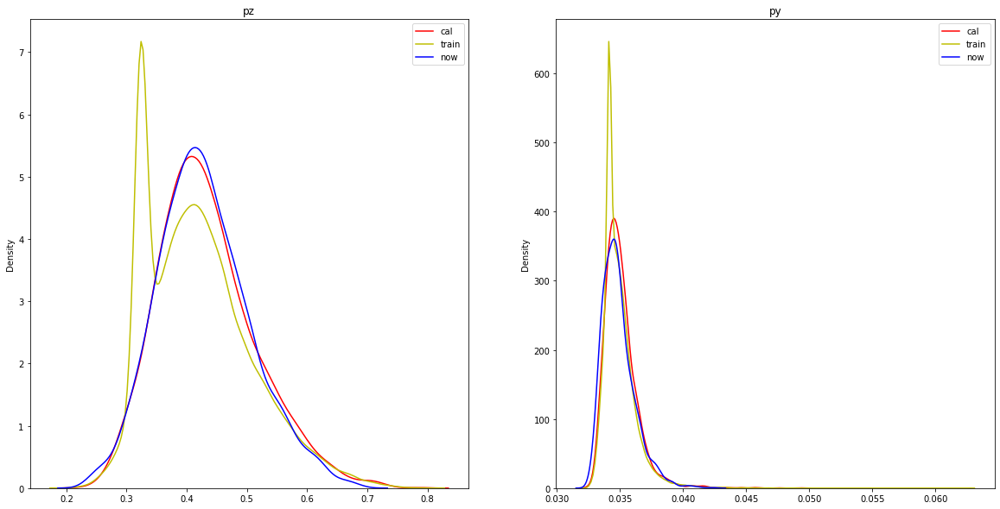

In [77]:
_, axs = plt.subplots(1, 2, figsize=(20, 10))

sns.kdeplot(cal_pzs, ax=axs[0], color='r', label='cal')
sns.kdeplot(train_pzs, ax=axs[0], color='y', label='train')
sns.kdeplot(pzs, ax=axs[0], color='b', label='now')
axs[0].set_title('pz')
axs[0].legend()

sns.kdeplot(cal_pys, ax=axs[1], color='r', label='cal')
sns.kdeplot(train_pys, ax=axs[1], color='y', label='train')
sns.kdeplot(pys, ax=axs[1], color='b', label='now')
axs[1].set_title('py')
axs[1].legend()

plt.show()

## OOD KMNIST

Expectation: z should fail to detect OOD since 'style' should be describing handwriting whereas y should be able to detect OOD since the images are noticeably different

In [78]:
from torchvision.datasets import KMNIST

In [79]:
kdata = KMNIST('.', train=True, download=True)

  0%|          | 0/18165135 [00:00<?, ?it/s]Downloading http://codh.rois.ac.jp/kmnist/dataset/kmnist/train-images-idx3-ubyte.gz to .\KMNIST\raw\train-images-idx3-ubyte.gz
18165760it [00:03, 4585998.81it/s]                              
Extracting .\KMNIST\raw\train-images-idx3-ubyte.gz to .\KMNIST\raw

29696it [00:00, 401166.10it/s]           
Extracting .\KMNIST\raw\train-labels-idx1-ubyte.gz to .\KMNIST\raw

3041280it [00:01, 2756838.77it/s]                             
Extracting .\KMNIST\raw\t10k-images-idx3-ubyte.gz to .\KMNIST\raw

100%|██████████| 5120/5120 [00:00<00:00, 5147372.12it/s]
Extracting .\KMNIST\raw\t10k-labels-idx1-ubyte.gz to .\KMNIST\raw
d:\venvs\pytorch-cv\lib\site-packages\torchvision\datasets\mnist.py:502: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or m

In [94]:
from torchvision.transforms import Resize
resize = Resize((32, 32))

data = kdata.data[:12000].float()
data = resize(torch.stack((data, data, data))).permute(1, 0, 2, 3)/255.

k_ds = TensorDataset(data)
k_sampler = RandomSampler(k_ds)
k_dl = DataLoader(k_ds, batch_size=1)

d:\venvs\pytorch-cv\lib\site-packages\torch\nn\modules\container.py:119: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


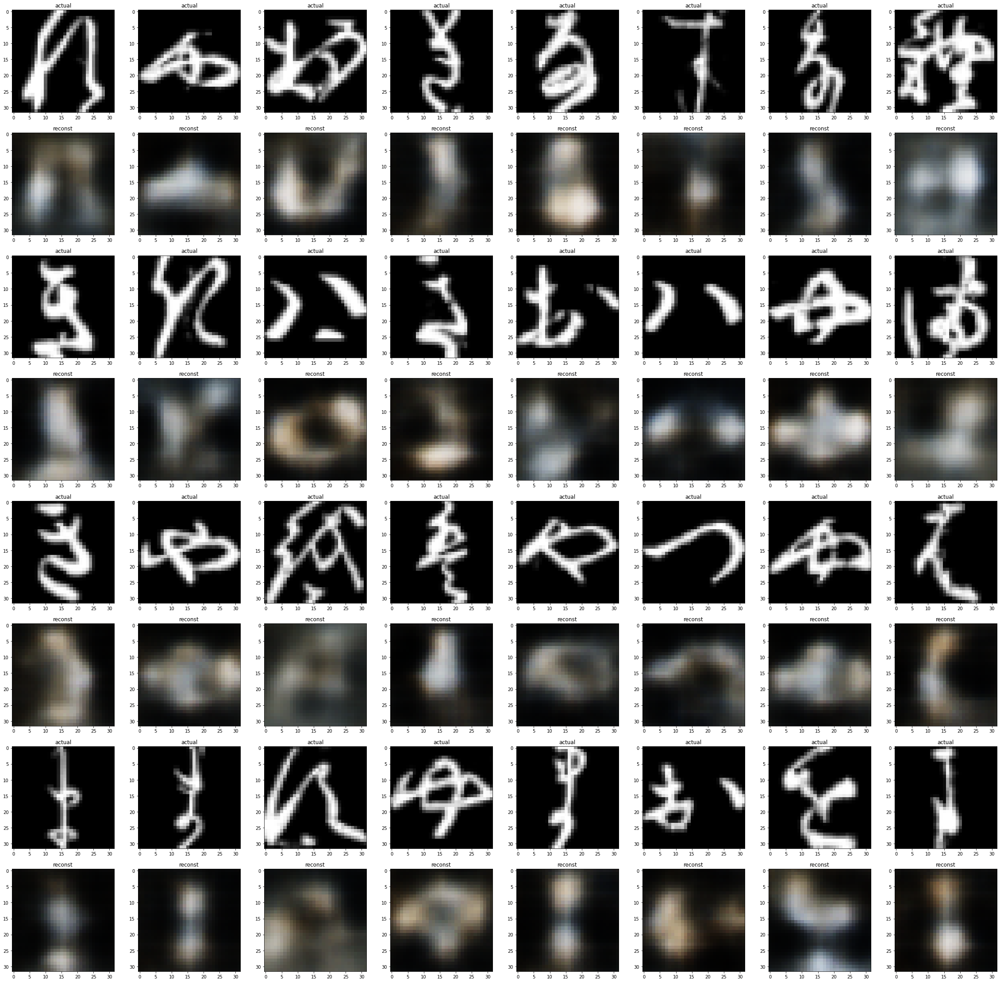

In [95]:
x = []
k_iter = iter(k_dl)
for i in range(32):
    x.extend(next(k_iter)[0])

f, axs = plt.subplots(8, 8, figsize = (40, 40))
x = torch.stack(x)

reconsts = model.get_reconst(x)

for i in range(32):
    row = 2*(i//8)
    col = i%8
    axs[row][col].imshow(x[i].permute(1, 2, 0).detach())
    axs[row][col].set_title('actual')
    axs[row+1][col].imshow(reconsts[i].permute(1, 2, 0).detach())
    axs[row+1][col].set_title('reconst')

In [96]:
model.cpu()
zscore = 0
yscore = 0
pzs = []
pyz = []
for x in tqdm(k_dl):
    z, y = model.get_latents(x[0])
    pz = model.discriminate(z, 'z')
    py = model.discriminate(y, 'y')
    zscore += sum(pz > test_pz)
    yscore += sum(py > test_py)
    pzs.append(pz.item())
    pyz.append(py.item())
print()
print(zscore/(len(k_dl)))
print(yscore/(len(k_dl)))

c_score = 0
t_score = 0
model.to(device)

for xs in tqdm(iter(k_dl)):
    xs = xs[0].to(device)
    reconst = model.get_reconst(xs)
    l = F.mse_loss(reconst, xs, reduction='sum')/xs.size(0)
    if l>cal_lim:
        c_score += 1
    if l>test_lim:
        t_score += 1

model.cpu()

print()
print(c_score/len(k_dl))
print(t_score/len(k_dl))

  0%|          | 14/12000 [00:00<01:26, 138.62it/s]
tensor([0.9028])
tensor([0.7654])
100%|██████████| 12000/12000 [01:22<00:00, 146.33it/s]
1.0
1.0



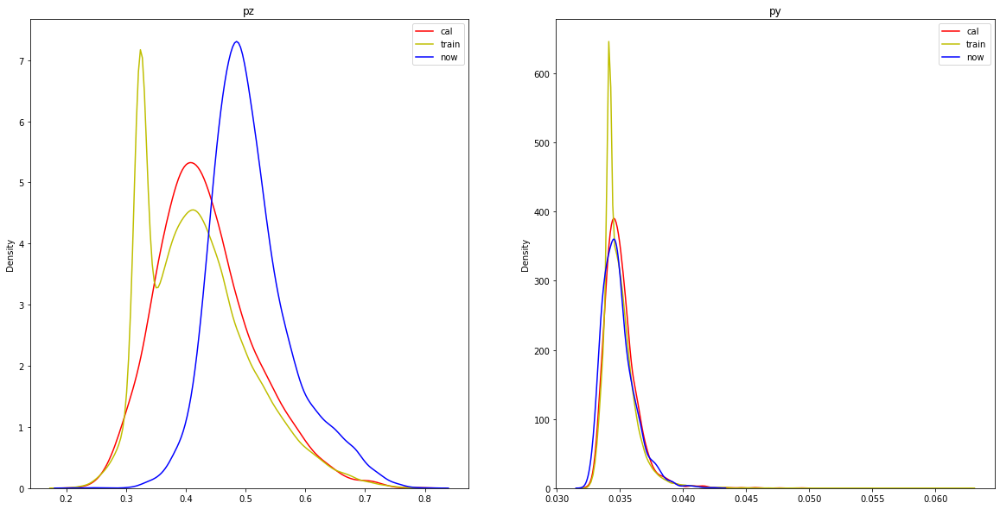

In [97]:
_, axs = plt.subplots(1, 2, figsize=(20, 10))

sns.kdeplot(cal_pzs, ax=axs[0], color='r', label='cal')
sns.kdeplot(train_pzs, ax=axs[0], color='y', label='train')
sns.kdeplot(pzs, ax=axs[0], color='b', label='now')
axs[0].set_title('pz')
axs[0].legend()

sns.kdeplot(cal_pys, ax=axs[1], color='r', label='cal')
sns.kdeplot(train_pys, ax=axs[1], color='y', label='train')
sns.kdeplot(pys, ax=axs[1], color='b', label='now')
axs[1].set_title('py')
axs[1].legend()

plt.show()

## FMNIST

Expectation: Both Z and Y should do well to detect OOD

In [98]:
from torchvision.datasets import FashionMNIST

In [99]:
fdata = FashionMNIST('/content', train=True, download=True)

26422272it [00:07, 3442653.62it/s]                              
Extracting /content\FashionMNIST\raw\train-images-idx3-ubyte.gz to /content\FashionMNIST\raw

29696it [00:00, 170782.24it/s]                          
Extracting /content\FashionMNIST\raw\train-labels-idx1-ubyte.gz to /content\FashionMNIST\raw

4422656it [00:01, 2274684.27it/s]                             
Extracting /content\FashionMNIST\raw\t10k-images-idx3-ubyte.gz to /content\FashionMNIST\raw

6144it [00:00, 6141516.63it/s]          
Extracting /content\FashionMNIST\raw\t10k-labels-idx1-ubyte.gz to /content\FashionMNIST\raw

Processing...
Done!


In [101]:
data = fdata.data[:12000].float()
data = resize(torch.stack((data, data, data))).permute(1, 0, 2, 3)/255.

f_ds = TensorDataset(data)
f_sampler = RandomSampler(f_ds)
f_dl = DataLoader(f_ds, batch_size=1)

d:\venvs\pytorch-cv\lib\site-packages\torch\nn\modules\container.py:119: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


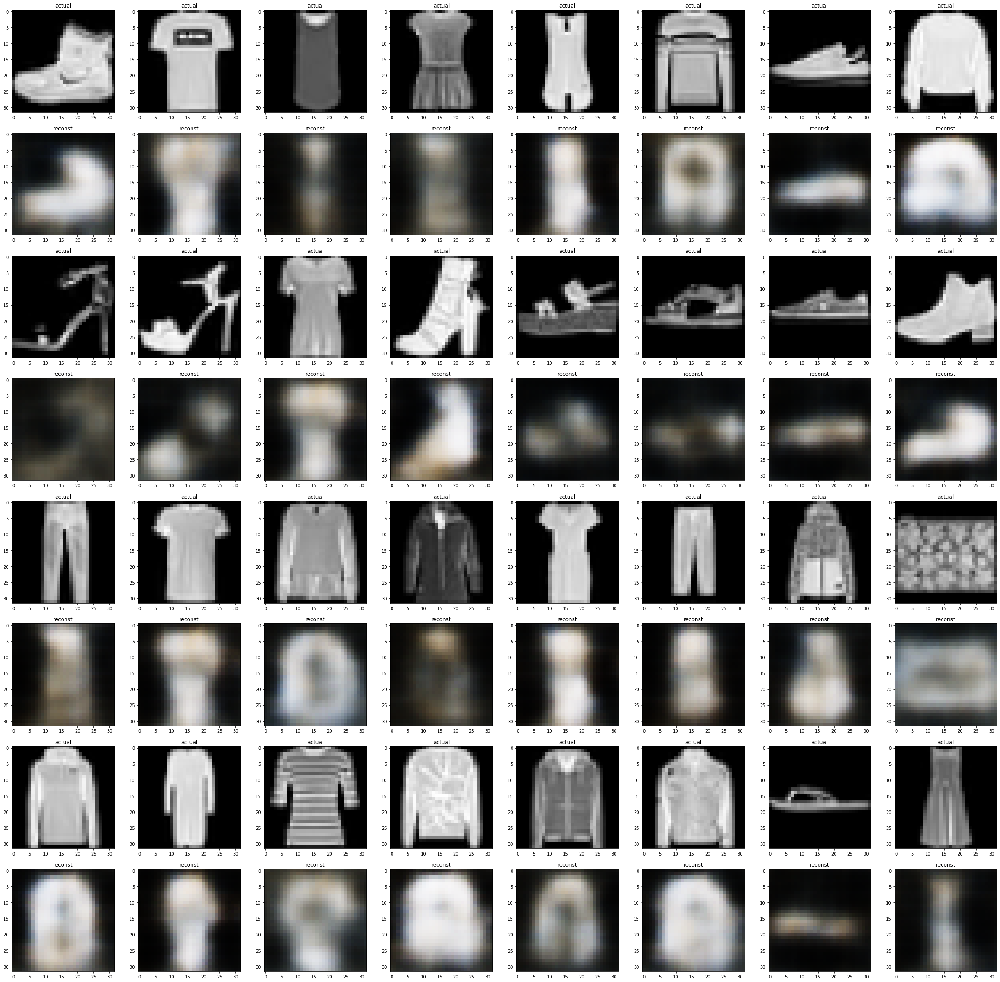

In [102]:
x = []
f_iter = iter(f_dl)
for i in range(32):
    x.extend(next(f_iter)[0])

f, axs = plt.subplots(8, 8, figsize = (40, 40))
x = torch.stack(x)

reconsts = model.get_reconst(x)

for i in range(32):
    row = 2*(i//8)
    col = i%8
    axs[row][col].imshow(x[i].permute(1, 2, 0).detach())
    axs[row][col].set_title('actual')
    axs[row+1][col].imshow(reconsts[i].permute(1, 2, 0).detach())
    axs[row+1][col].set_title('reconst')

In [103]:
model.cpu()
zscore = 0
yscore = 0
pzs = []
pyz = []
for x in tqdm(f_dl):
    z, y = model.get_latents(x[0])
    pz = model.discriminate(z, 'z')
    py = model.discriminate(y, 'y')
    zscore += sum(pz > test_pz)
    yscore += sum(py > test_py)
    pzs.append(pz.item())
    pyz.append(py.item())
print()
print(zscore/(len(f_dl)))
print(yscore/(len(f_dl)))

c_score = 0
t_score = 0
model.to(device)

for xs in tqdm(iter(f_dl)):
    xs = xs[0].to(device)
    reconst = model.get_reconst(xs)
    l = F.mse_loss(reconst, xs, reduction='sum')/xs.size(0)
    if l>cal_lim:
        c_score += 1
    if l>test_lim:
        t_score += 1

model.cpu()

print()
print(c_score/len(f_dl))
print(t_score/len(f_dl))

  0%|          | 16/12000 [00:00<01:18, 152.39it/s]
tensor([0.7451])
tensor([0.6597])
100%|██████████| 12000/12000 [01:21<00:00, 148.05it/s]
1.0
1.0



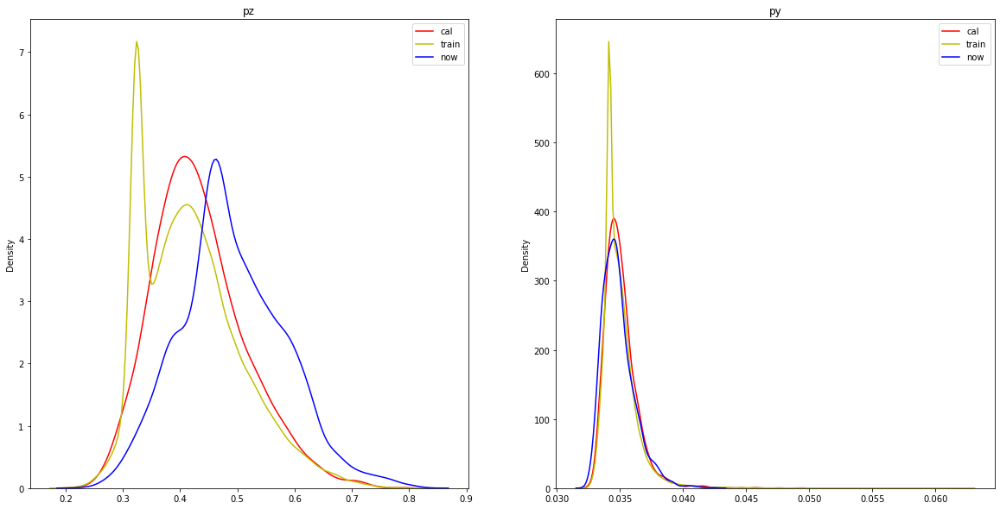

In [104]:
_, axs = plt.subplots(1, 2, figsize=(20, 10))

sns.kdeplot(cal_pzs, ax=axs[0], color='r', label='cal')
sns.kdeplot(train_pzs, ax=axs[0], color='y', label='train')
sns.kdeplot(pzs, ax=axs[0], color='b', label='now')
axs[0].set_title('pz')
axs[0].legend()

sns.kdeplot(cal_pys, ax=axs[1], color='r', label='cal')
sns.kdeplot(train_pys, ax=axs[1], color='y', label='train')
sns.kdeplot(pys, ax=axs[1], color='b', label='now')
axs[1].set_title('py')
axs[1].legend()

plt.show()

# OOD Entropy

In [ ]:
import skimage
from scipy.stats import entropy

In [ ]:
x = next(iter(cal_dl))

In [ ]:
_, counts = np.unique(x[0], return_counts=True)
entropy(counts)

1.0348617575308923

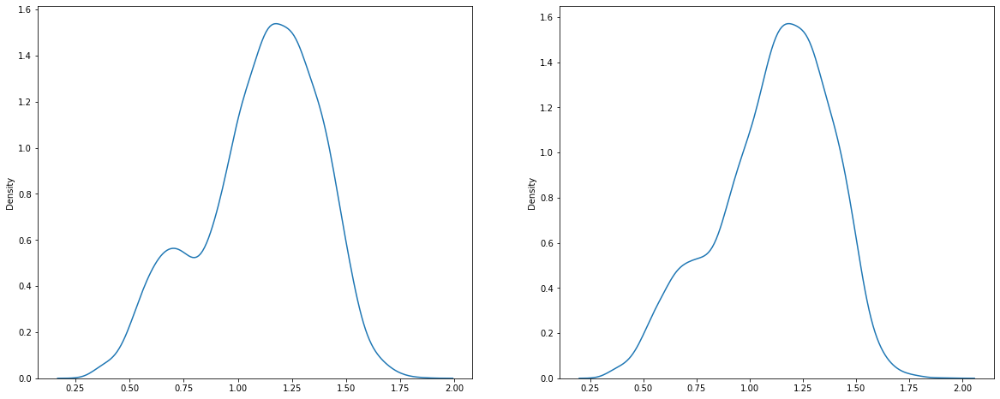

In [ ]:
cal_en = []
test_en = []

for _, xs, _ in iter(cal_dl):
    _, counts = np.unique(xs, return_counts=True)
    cal_en.append(entropy(counts))

for _, xs, _ in iter(test_dl):
    _, counts = np.unique(xs, return_counts=True)
    test_en.append(entropy(counts))

_, axs = plt.subplots(1, 2, figsize=(20, 8))
sns.kdeplot(cal_en, ax=axs[0])
sns.kdeplot(test_en, ax=axs[1])

In [ ]:
test_en = pd.Series(test_en)

print(test_en.describe())

low_q = test_en.describe()['25%']
up_q = test_en.describe()['75%']
med = test_en.describe()['50%']
iqr = up_q - low_q

test_en_lims = (med-1.5*iqr, med+1.5*iqr)
test_en_lims

count    6000.000000
mean        1.115113
std         0.261768
min         0.253336
25%         0.957161
50%         1.153503
75%         1.308876
max         1.816993
dtype: float64


(0.6259297018683873, 1.6810769148020777)

In [ ]:
cal_en = pd.Series(cal_en)

print(cal_en.describe())

low_q = cal_en.describe()['25%']
up_q = cal_en.describe()['75%']
med = cal_en.describe()['50%']
iqr = up_q - low_q

cal_en_lims = (med-1.5*iqr, med+1.5*iqr)
cal_en_lims

count    2000.000000
mean        1.103923
std         0.269090
min         0.322599
25%         0.952332
50%         1.147439
75%         1.300048
max         1.785221
dtype: float64


(0.6258653789060978, 1.669012319629262)

In [ ]:
en_score = 0

for x, _, _ in tqdm(ood_dl):
    x = x+0.6*torch.randn_like(x)
    _, counts = np.unique(x, return_counts=True)
    en_score += 1*(not test_en_lims[0]<entropy(counts)<test_en_lims[1])

print()
print(en_score/len(ood_dl))

100%|██████████| 12000/12000 [00:03<00:00, 3926.63it/s]


1.0


In [ ]:
en_score = 0

for x, _, _ in tqdm(ood_dl):
    x = x.flip(1)
    _, counts = np.unique(x, return_counts=True)
    en_score += 1*(not test_en_lims[0]<entropy(counts)<test_en_lims[1])

print()
print(en_score/len(ood_dl))

100%|██████████| 12000/12000 [00:01<00:00, 6393.30it/s]


0.06216666666666667


In [ ]:
en_score = 0

for x in tqdm(k_dl):
    _, counts = np.unique(x[0], return_counts=True)
    en_score += 1*(not test_en_lims[0]<entropy(counts)<test_en_lims[1])

print()
print(en_score/len(ood_dl))

100%|██████████| 12000/12000 [00:01<00:00, 8315.41it/s]


0.7583333333333333
